# Chicago Temperature Analysis

::: {.callout-note title="Target Goals" collapse="false" style="width:100%;"}

- Repeat this analysis with:
    - Different climate variables
    - Another state / geographic area
    - Another climate scenario

- Any interesting trends or insights to be drawn from the data

:::


In [1]:
#| code-fold: true
#| code-summary: Imports
%matplotlib inline
import matplotlib_inline
import matplotlib.pyplot as plt
import geopandas as gpd
import warnings

import matplotlib.pyplot as plt

# from enrich.console import Console, get_theme
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
from ClimRR.data import DATA_DIR
from ClimRR import get_logger, set_plot_style
set_plot_style()
log = get_logger('ClimRR')
from rich.console import Console as rConsole
from enrich.style import STYLES
from rich.theme import Theme

theme = Theme(STYLES)
log = get_logger('ClimRR')
console = rConsole(theme=theme, log_path=False, markup=True)

Using updated plot style for matplotlib

In [2]:
from ClimRR.data import load_shapefile, load_csvs

shape = load_shapefile()
data = load_csvs(shape)

data['FireWeatherIndex_Wildfire'].shape=(62834, 35)

data['HeatingDegreeDays'].shape=(62834, 10)

data['AnnualTemperatureMinimum'].shape=(62834, 18)

data['SeasonalTemperatureMaximum'].shape=(62834, 27)

data['ConsecutiveDayswithNoPrecipitation'].shape=(55896, 19)

data['SeasonalTemperatureMinimum'].shape=(62834, 27)

data['WindSpeed'].shape=(62834, 18)

data['AnnualTemperatureMaximum'].shape=(62834, 18)

data['Precipitation_inches_AnnualTotal'].shape=(55896, 18)

In [3]:
console.print("Data: \n" + f"\n".join(list(data.keys())))

Data: 
FireWeatherIndex_Wildfire
HeatingDegreeDays
AnnualTemperatureMinimum
SeasonalTemperatureMaximum
ConsecutiveDayswithNoPrecipitation
SeasonalTemperatureMinimum
WindSpeed
AnnualTemperatureMaximum
Precipitation_inches_AnnualTotal

In [4]:
# counties = gpd.read_file(
#     'https://public.opendatasoft.com/api/explore/v2.1/catalog/datasets/georef-united-states-of-america-county/exports/shp?lang=en&timezone=America%2FChicago'
# )
from ClimRR.data import load_counties
counties = load_counties(crs=shape.crs)

In [5]:
counties.head(n=5)

,year,ste_code,ste_name,coty_code,coty_name,coty_area_,coty_type,coty_name_,coty_fp_co,coty_gnis_,geometry
0,2022,['29'],['Missouri'],['29081'],['Harrison'],USA,county,['Harrison County'],081,00758495,"POLYGON ((-10489884.973 4949400.757, -10487772..."
1,2022,['29'],['Missouri'],['29099'],['Jefferson'],USA,county,['Jefferson County'],099,00758504,"POLYGON ((-10089996.419 4590245.129, -10090028..."
2,2022,['29'],['Missouri'],['29145'],['Newton'],USA,county,['Newton County'],145,00758527,"POLYGON ((-10470623.473 4445817.195, -10470640..."
3,2022,['29'],['Missouri'],['29223'],['Wayne'],USA,county,['Wayne County'],223,00758564,"POLYGON ((-10105533.614 4446123.627, -10105492..."
4,2022,['30'],['Montana'],['30053'],['Lincoln'],USA,county,['Lincoln County'],053,01720038,"POLYGON ((-12771356.786 6274948.609, -12771395..."


In [6]:
illinois = counties[counties['ste_name'] == "['Illinois']"]
console.log(f"illinois.shape={illinois.shape}")
illinois.head(n=5)

[19:31:26] illinois.shape=(102, 11)

,year,ste_code,ste_name,coty_code,coty_name,coty_area_,coty_type,coty_name_,coty_fp_co,coty_gnis_,geometry
31,2022,['17'],['Illinois'],['17025'],['Clay'],USA,county,['Clay County'],025,00424214,"POLYGON ((-9873318.708 4709448.559, -9873005.6..."
32,2022,['17'],['Illinois'],['17065'],['Hamilton'],USA,county,['Hamilton County'],065,00424234,"POLYGON ((-9874775.991 4566267.709, -9874777.2..."
33,2022,['17'],['Illinois'],['17077'],['Jackson'],USA,county,['Jackson County'],077,00424240,"POLYGON ((-9927204.688 4572408.800, -9925575.1..."
97,2022,['17'],['Illinois'],['17001'],['Adams'],USA,county,['Adams County'],001,00424202,"POLYGON ((-10120274.096 4894041.102, -10120277..."
98,2022,['17'],['Illinois'],['17067'],['Hancock'],USA,county,['Hancock County'],067,00424235,"POLYGON ((-10120274.096 4894041.102, -10120442..."


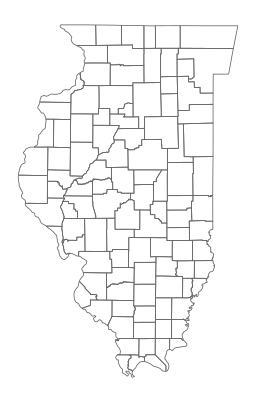

In [7]:
fig, ax = plt.subplots(figsize=(10, 7))
ax = illinois.boundary.plot(ax=ax, color='#666666', linewidth=0.8)
ax.set_axis_off()

In [8]:
illinois_hdd = data["HeatingDegreeDays"].clip(illinois)
illinois_hdd.head(n=2)

,OBJECTID,Crossmodel,Shape_Leng,Shape_Area,geometry,hist,rcp85_midc,mid85_hist,boundary,centroid
21130,21131,R137C419,61562.240069,2.368692e+08,"POLYGON ((-9925519.402 4437348.204, -9922237.2...",5618.240234,5188.899902,-429.347992,"LINESTRING (-9910499.397 4433932.370, -9913921...",POINT (-9919714.441 4428138.497)
15883,15884,R137C418,61585.714048,2.370499e+08,"MULTIPOLYGON (((-9940550.883 4440740.008, -993...",5668.370117,5196.740234,-471.623993,"LINESTRING (-9943924.960 4425714.844, -9940550...",POINT (-9934728.187 4431536.593)


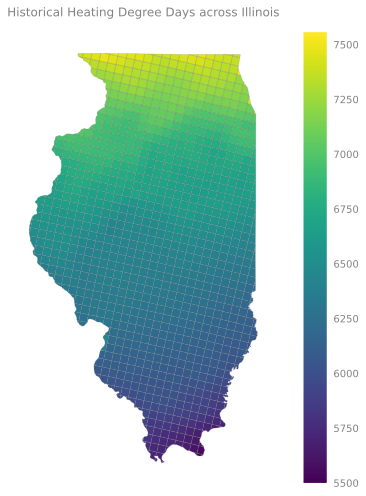

In [9]:
_, ax = plt.subplots(figsize=(10, 7))
ax = illinois_hdd.boundary.plot(color='#666666', linewidth=0.8, ax=ax, alpha=0.2)
ax = illinois_hdd.plot(column='hist', ax=ax, legend=True)
ax.set_axis_off()
ax.set_title('Historical Heating Degree Days across Illinois')
plt.tight_layout()

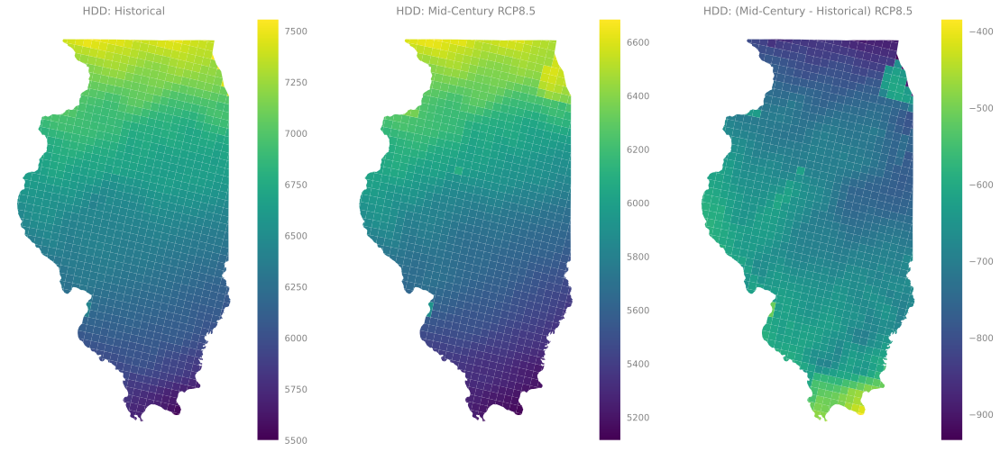

In [10]:
fig, ax = plt.subplots(ncols=3, figsize=(16, 7), sharey='row')
ax0 = illinois_hdd.plot('hist', ax=ax[0], legend=True)
ax1 = illinois_hdd.plot('rcp85_midc', ax=ax[1], legend=True)
ax2 = illinois_hdd.plot('mid85_hist', ax=ax[2], legend=True)
ax0.set_title("HDD: Historical")
ax1.set_title("HDD: Mid-Century RCP8.5")
ax2.set_title("HDD: (Mid-Century - Historical) RCP8.5")
ax0.set_axis_off()
ax1.set_axis_off()
ax2.set_axis_off()
plt.tight_layout()

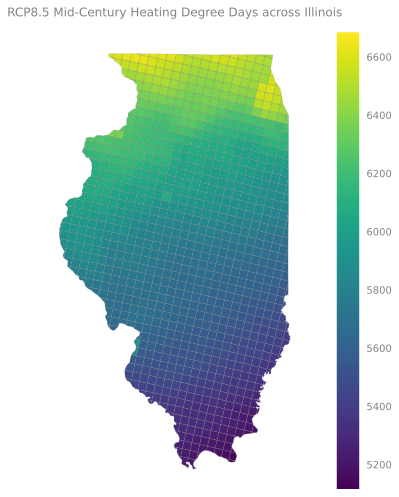

In [11]:
_, ax = plt.subplots(figsize=(10, 7))
ax = illinois_hdd.boundary.plot(color='#666666', linewidth=0.8, ax=ax, alpha=0.2)
ax = illinois_hdd.plot(column='rcp85_midc', ax=ax, legend=True)
ax.set_axis_off()
ax.set_title('RCP8.5 Mid-Century Heating Degree Days across Illinois')
plt.tight_layout()

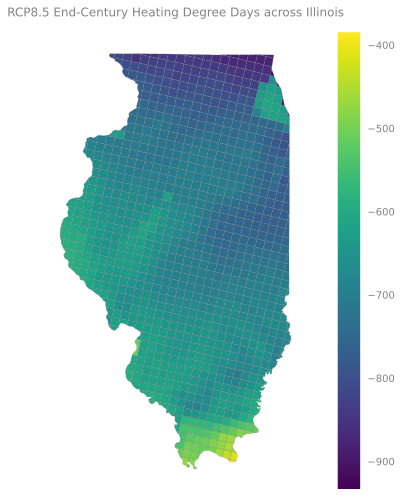

In [12]:
_, ax = plt.subplots(figsize=(10, 7))
ax = illinois_hdd.boundary.plot(color='#666666', linewidth=0.8, ax=ax, alpha=0.2)
ax = illinois_hdd.plot(column='mid85_hist', ax=ax, legend=True)
ax.set_axis_off()
ax.set_title('RCP8.5 End-Century Heating Degree Days across Illinois')
plt.tight_layout()

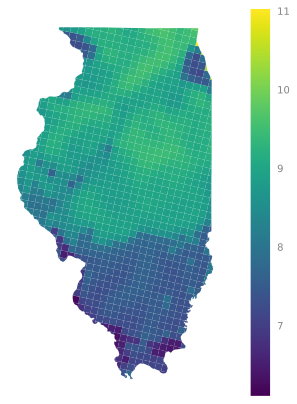

In [13]:
fig, ax = plt.subplots(figsize=(10, 7))
wind_il = data['WindSpeed'].clip(
    illinois,
    # how='intersection'
)
# ax = wind_il.boundary.plot(ax=ax, color='#666666', linewidth=0.8)
ax = wind_il.plot(column='hist', ax=ax, linewidth=0.8, legend=True)
ax.set_axis_off()

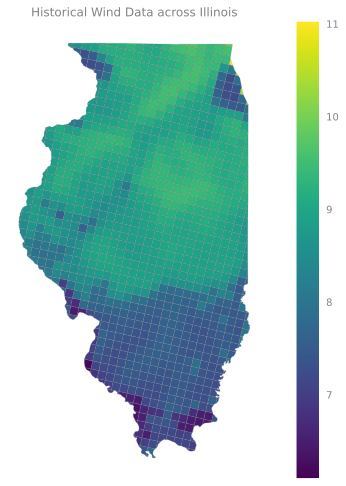

In [14]:
_, ax = plt.subplots(figsize=(10, 7))
ax = wind_il.boundary.plot(color='#666666', linewidth=0.8, ax=ax, alpha=0.2)
ax = wind_il.plot(column='hist', ax=ax, legend=True)
ax.set_axis_off()
ax.set_title('Historical Wind Data across Illinois')
plt.tight_layout()

In [15]:
# wind_il.explore(column='hist')
wind_il.head(n=2)

,OBJECTID,Crossmodel,Shape_Leng,Shape_Area,geometry,hist,rcp45_midc,rcp45_endc,rcp85_midc,rcp85_endc,mid45_hist,end45_hist,mid85_hist,end85_hist,mid85_45,end85_45,boundary,centroid
21130,21131,R137C419,61562.240069,2.368692e+08,"POLYGON ((-9925519.402 4437348.204, -9922237.2...",7.36933,7.40137,7.53169,7.46885,7.43563,0.032043,0.162359,0.099523,0.066305,0.067481,-0.096054,"LINESTRING (-9910499.397 4433932.370, -9913921...",POINT (-9919714.441 4428138.497)
15883,15884,R137C418,61585.714048,2.370499e+08,"MULTIPOLYGON (((-9940550.883 4440740.008, -993...",7.76390,7.78540,7.90540,7.86042,7.82429,0.021496,0.141499,0.096518,0.060394,0.075023,-0.081105,"LINESTRING (-9943924.960 4425714.844, -9940550...",POINT (-9934728.187 4431536.593)


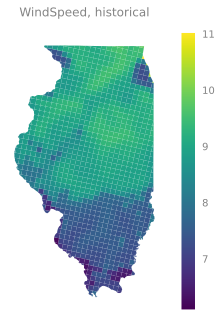

In [16]:
_, ax = plt.subplots()
ax = wind_il.plot(column='hist', ax=ax, legend=True)
_ = ax.set_title('WindSpeed, historical')
ax.set_axis_off()

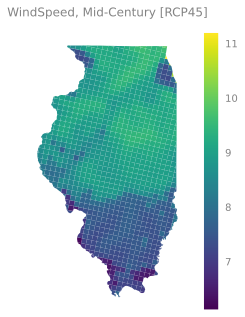

In [17]:
fig, ax = plt.subplots()
ax = wind_il.plot(column='rcp45_midc', ax=ax, legend=True)
ax.set_axis_off()
_ = ax.set_title('WindSpeed, Mid-Century [RCP45]')

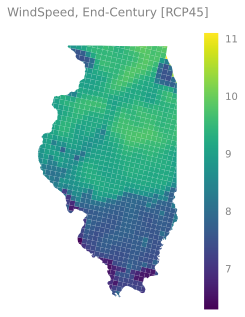

In [18]:
fig, ax = plt.subplots()
_ = ax.set_title('WindSpeed, End-Century [RCP45]')
# _ = ax.legend(loc='best')
ax = wind_il.plot(column='rcp45_endc', ax=ax, legend=True)
ax.set_axis_off()

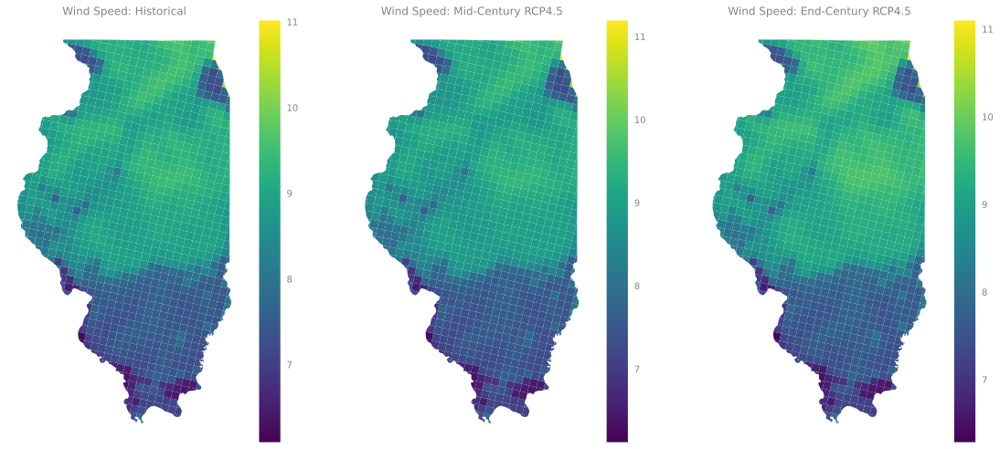

In [19]:
fig, ax = plt.subplots(ncols=3, figsize=(16, 7))
ax0 = wind_il.plot('hist', ax=ax[0], legend=True)
ax1 = wind_il.plot('rcp45_midc', ax=ax[1], legend=True)
ax2 = wind_il.plot('rcp45_endc', ax=ax[2], legend=True)
ax0.set_title("Wind Speed: Historical")
ax1.set_title("Wind Speed: Mid-Century RCP4.5")
ax2.set_title("Wind Speed: End-Century RCP4.5")
ax0.set_axis_off()
ax1.set_axis_off()
ax2.set_axis_off()
plt.tight_layout()

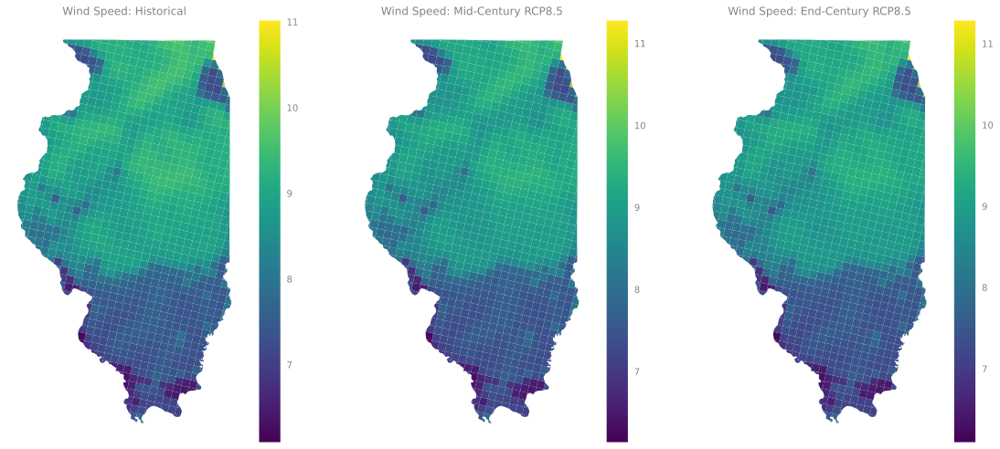

In [20]:
fig, ax = plt.subplots(ncols=3, figsize=(16, 7))
ax0 = wind_il.plot('hist', ax=ax[0], legend=True)
ax1 = wind_il.plot('rcp85_midc', ax=ax[1], legend=True)
ax2 = wind_il.plot('rcp85_endc', ax=ax[2], legend=True)
ax0.set_title("Wind Speed: Historical")
ax1.set_title("Wind Speed: Mid-Century RCP8.5")
ax2.set_title("Wind Speed: End-Century RCP8.5")
ax0.set_axis_off()
ax1.set_axis_off()
ax2.set_axis_off()
plt.tight_layout()

In [21]:
data['WindSpeed'].shape

(62834, 18)

In [22]:
selection = shape[0:5]

for index, row in selection.iterrows():
    # get the area of the polygon
    poly_area = row['geometry'].area
    console.print(f"Polygon area at {index} is {poly_area:.3f}")

Polygon area at 0 is 252927293.657

Polygon area at 1 is 235501313.715

Polygon area at 2 is 233416379.950

Polygon area at 3 is 261761834.191

Polygon area at 4 is 226073092.218